# ISRO SAC Forecast Viz

**Contributors:** Deepak Cherian(NCAR), Aneesh Subramanian (CU, Boulder), Neeraj S. (ISRO)

```{contents}
```

In [1]:
import datetime


import astral
import cf_xarray  # noqa
import xarray as xr

import hvplot.xarray  # noqa
import holoviews as hv

import matplotlib.pyplot as plt

plt.rcParams["font.size"] = 13

time = datetime.datetime.now()
nice_time = time.strftime("%Y-%m-%dT%T")
print(f"Last updated: {time}")

send_email = False
%load_ext watermark
%watermark -iv

Last updated: 2023-06-07 16:07:08.272484
json      : 2.0.9
hvplot    : 0.8.3
sys       : 3.11.3 | packaged by conda-forge | (main, Apr  6 2023, 08:57:19) [GCC 11.3.0]
matplotlib: 3.7.1
cf_xarray : 0.8.1
xarray    : 2022.6.1.dev225+g19838dce1.d20230607
holoviews : 1.16.1



In [2]:
hv.opts.defaults(
    hv.opts.Curve(muted_alpha=0, fontscale=1.3, line_width=2, color=hv.Cycle("Dark2")),
    hv.opts.Area(color=hv.Cycle("Dark2"), muted_fill_alpha=0, muted_line_alpha=0),
    hv.opts.Layout(fontscale=1.3, sizing_mode="stretch_width", toolbar="left"),
    hv.opts.Overlay(
        active_tools=["box_zoom"],
        default_tools=["save", "pan", "box_zoom", "reset"],
        toolbar="left",
    ),
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
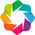

In [31]:

hv.notebook_extension("bokeh")

## Read forecast data

In [3]:
ds = astral.read_forecast_data()
ds

<xarray.Dataset>
Dimensions:   (xt_i: 560, yt_j: 400, xu_i: 560, yu_j: 400, zt_k: 50, lead: 21,
               init: 4)
Coordinates:
  * xt_i      (xt_i) float32 27.5 28.5 29.48 30.46 ... 138.5 139.5 140.5 141.5
  * yt_j      (yt_j) float32 -34.5 -33.5 -32.52 -31.54 ... 25.75 25.85 25.95
  * xu_i      (xu_i) float32 28.0 28.99 29.97 30.93 ... 139.0 140.0 141.0 142.0
  * yu_j      (yu_j) float32 -34.0 -33.01 -32.03 -31.07 ... 25.7 25.8 25.9 26.0
  * zt_k      (zt_k) float32 1.0 3.017 5.084 ... 4.175e+03 4.731e+03 5.32e+03
  * lead      (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
  * init      (init) datetime64[ns] 2023-06-02 2023-06-03 2023-06-05 2023-06-06
    time      (init, lead) datetime64[ns] 2023-06-02 ... 2023-06-11
Data variables:
    temp      (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    salinity  (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    u         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    v         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 50, 400, 560), meta=np.ndarray>
    hmxl      (init, lead, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 400, 560), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.7.0 (http://mpimet.mpg....
    Conventions:     CF-1.4
    history:         Fri Jun 02 16:25:33 2023: cdo cat -settaxis,2023-06-02,0...
    filename:        time_mean.000047.06.02.dta.nc
    MPP_IO_VERSION:  $Id: mpp_io.F90,v 5.3 1999/12/03 16:59:31 vb Exp $
    title:           Time mean  {MOM 3.0}
    CDO:             Climate Data Operators version 1.7.0 (http://mpimet.mpg....

## Subset to moorings

In [4]:
moors = xr.concat(
    [
        ds.cf.sel(**loc, method="nearest")
        .assign_coords(moor=name)
        .cf.sel(Z=slice(500))  # .load()
        for name, loc in astral.LOCS.items()
    ],
    dim="moor",
)
moors.attrs["last_extracted"] = nice_time
moors

<xarray.Dataset>
Dimensions:   (moor: 3, zt_k: 33, lead: 21, init: 4)
Coordinates:
    xt_i      (moor) float32 67.45 68.95 68.65
    yt_j      (moor) float32 18.55 14.95 12.05
    xu_i      (moor) float32 67.4 69.0 68.6
    yu_j      (moor) float32 18.5 14.9 12.1
  * zt_k      (zt_k) float32 1.0 3.017 5.084 7.23 ... 316.1 363.7 423.7 496.1
  * lead      (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
  * init      (init) datetime64[ns] 2023-06-02 2023-06-03 2023-06-05 2023-06-06
    time      (init, lead) datetime64[ns] 2023-06-02 ... 2023-06-11
  * moor      (moor) <U4 'AD06' 'AD07' 'AD08'
Data variables:
    temp      (moor, init, lead, zt_k) float32 dask.array<chunksize=(1, 1, 21, 33), meta=np.ndarray>
    salinity  (moor, init, lead, zt_k) float32 dask.array<chunksize=(1, 1, 21, 33), meta=np.ndarray>
    u         (moor, init, lead, zt_k) float32 dask.array<chunksize=(1, 1, 21, 33), meta=np.ndarray>
    v         (moor, init, lead, zt_k) float32 dask.array<chunksize=(1, 1, 21, 33), meta=np.ndarray>
    hmxl      (moor, init, lead) float32 dask.array<chunksize=(1, 1, 21), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.7.0 (http://mpimet.mpg....
    Conventions:     CF-1.4
    history:         Fri Jun 02 16:25:33 2023: cdo cat -settaxis,2023-06-02,0...
    filename:        time_mean.000047.06.02.dta.nc
    MPP_IO_VERSION:  $Id: mpp_io.F90,v 5.3 1999/12/03 16:59:31 vb Exp $
    title:           Time mean  {MOM 3.0}
    CDO:             Climate Data Operators version 1.7.0 (http://mpimet.mpg....
    last_extracted:  2023-06-07T16:07:08

In [5]:
init_time = moors.init[-1].dt.strftime("%Y-%m-%dT%H.%M").data.item()

moors.load().to_netcdf(
    f"isro-forecast-ad-moorings-{init_time.replace(':', '.')}.nc", mode="w"
)
moors.load().to_netcdf("isro-forecast-ad-moorings-latest.nc", mode="w")

In [6]:
import subprocess

if send_email:
    subprocess.run(
        [
            "mail",
            "-s",
            f"'ISRO forecast initialized {init_time}'",
            "-a",
            "isro-forecast-ad-moorings-latest.nc",
            "dcherian@ucar.edu",
            "skerhalkar@umassd.edu",
        ]
    )

## Animations: T, S, u, v at 1m, 25m, 50m

In [7]:
subset = ds.cf.sel(
    X=slice(63, 78),
    Y=slice(4, 24),
    Z=slice(200),
).load()
decimated = subset.cf.isel(
    init=-1, Y=slice(None, None, 4), X=slice(None, None, 4)
).load()

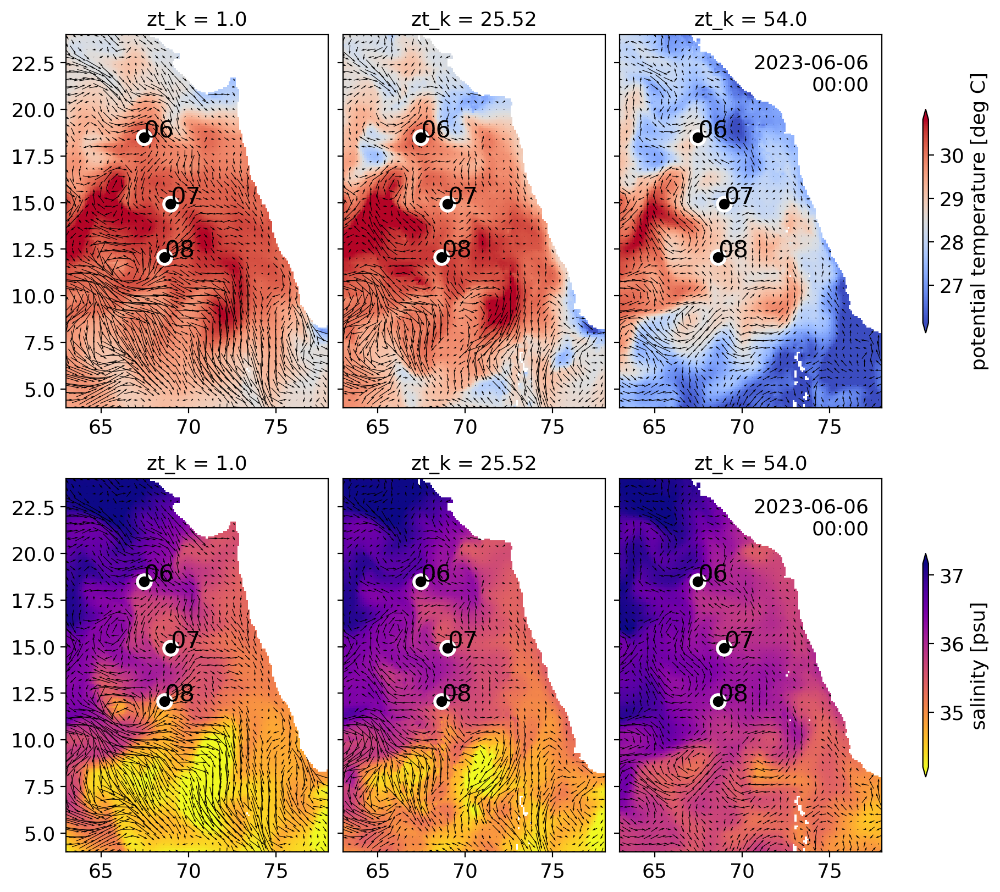

In [8]:
%autoreload

fig = plt.figure(layout="constrained", figsize=(9, 8))
# subfigs_lr = fig.subfigures(1, 2, width_ratios=(1,3))
subfigs_TS = fig.subfigures(2, 1)


fg = {
    "temp": astral.plot_frame(
        subset.temp.isel(init=-1), decimated, cmap="coolwarm", fig=subfigs_TS[0]
    ),
    "salinity": astral.plot_frame(
        subset.salinity.isel(init=-1),
        decimated,
        cmap="plasma_r",
        fig=subfigs_TS[1],
    ),
    # "hxml": astral.plot_frame(
    #    subset.hmxl.isel(init=-1), decimated, cmap="plasma_r", fig=subfigs_lr[0],
    # ),
}

# fig

In [9]:
import matplotlib.animation as animation


def update_both(i):
    for var in ["temp", "salinity"]:
        astral.update_frame_lead(
            i=i,
            varname=var,
            fg=fg[var],
            subset=subset,
            decimated=decimated,
        )


ani = animation.FuncAnimation(
    fig,
    update_both,
    repeat=True,
    frames=subset.sizes["lead"] - 1,
    interval=20,
)

In [10]:
writer = animation.PillowWriter(fps=4, bitrate=300)
ani.save("isro-TS.gif", writer=writer, dpi=84)
# ani.save(f"isro-TS.gif", writer="imagemagick")

```{image} ./isro-TS.gif
:align: center
```


In [ ]:
#writer = animation.HTMLWriter(fps=4, bitrate=200, embed_frames=True)
#ani.save("isro-TS.html", writer=writer)

# del ani

## mixed layer depth. SSU, SSV

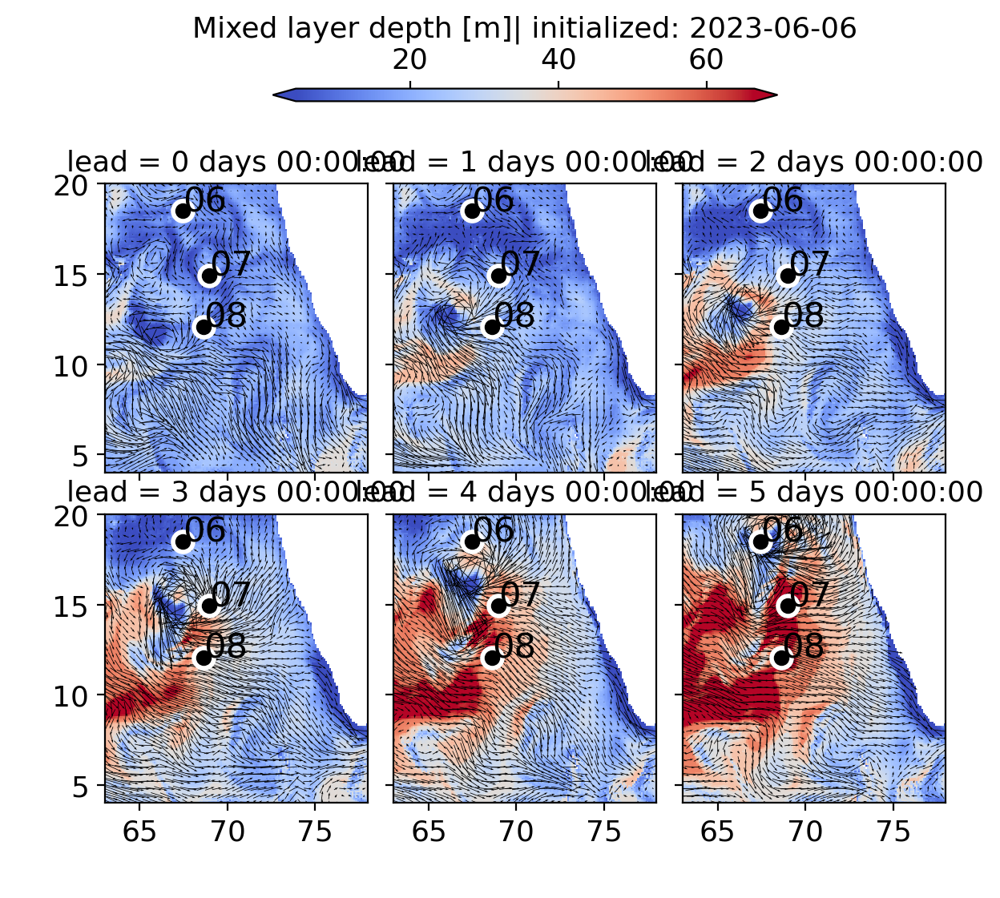

In [43]:
%autoreload

fg = astral.plot_facetgrid(
    subset.hmxl.cf.sel(Y=slice(20)).isel(lead=slice(None, None, 4)),
    decimated,
    cbar_location="top",
    pad=0.1,
    col_wrap=3,
)
fg.set_xlabels(" ")
fg.set_ylabels(" ")
fg.fig.set_size_inches((6, 6))

## SST, SSS, HMXL timeseries

In [20]:
surf = moors.cf.sel(Z=0, method="nearest").load()

In [21]:
astral.plot_surface_vars(moors.sel(moor="AD06"))

:Layout
   .NdOverlay.I   :NdOverlay   [init]
      :Curve   [time]   (temp)
   .NdOverlay.II  :NdOverlay   [init]
      :Curve   [time]   (salinity)
   .NdOverlay.III :NdOverlay   [init]
      :Curve   [time]   (hmxl)

In [22]:
astral.plot_surface_vars(moors.sel(moor="AD07"))

:Layout
   .NdOverlay.I   :NdOverlay   [init]
      :Curve   [time]   (temp)
   .NdOverlay.II  :NdOverlay   [init]
      :Curve   [time]   (salinity)
   .NdOverlay.III :NdOverlay   [init]
      :Curve   [time]   (hmxl)

In [23]:
astral.plot_surface_vars(moors.sel(moor="AD08"))

:Layout
   .NdOverlay.I   :NdOverlay   [init]
      :Curve   [time]   (temp)
   .NdOverlay.II  :NdOverlay   [init]
      :Curve   [time]   (salinity)
   .NdOverlay.III :NdOverlay   [init]
      :Curve   [time]   (hmxl)

## T, S time series

In [24]:
astral.plot_ts_profiles_line(moors.sel(moor="AD06"))

:Layout
   .NdOverlay.I  :NdOverlay   [zt_k]
      :Curve   [time]   (temp)
   .NdOverlay.II :NdOverlay   [zt_k]
      :Curve   [time]   (salinity)

In [25]:
astral.plot_ts_profiles_line(moors.sel(moor="AD07"))

:Layout
   .NdOverlay.I  :NdOverlay   [zt_k]
      :Curve   [time]   (temp)
   .NdOverlay.II :NdOverlay   [zt_k]
      :Curve   [time]   (salinity)

In [26]:
astral.plot_ts_profiles_line(moors.sel(moor="AD08"))

:Layout
   .NdOverlay.I  :NdOverlay   [zt_k]
      :Curve   [time]   (temp)
   .NdOverlay.II :NdOverlay   [zt_k]
      :Curve   [time]   (salinity)

## T, S forecast profiles

### T

In [27]:
astral.plot_forecast_offset_lines(moors.temp)

:Layout
   .NdOverlay.I   :NdOverlay   [time]
      :Curve   [temp]   (zt_k)
   .NdOverlay.II  :NdOverlay   [time]
      :Curve   [temp]   (zt_k)
   .NdOverlay.III :NdOverlay   [time]
      :Curve   [temp]   (zt_k)

### S

In [28]:
%autoreload

astral.plot_forecast_offset_lines(moors.salinity)

:Layout
   .NdOverlay.I   :NdOverlay   [time]
      :Curve   [salinity]   (zt_k)
   .NdOverlay.II  :NdOverlay   [time]
      :Curve   [salinity]   (zt_k)
   .NdOverlay.III :NdOverlay   [time]
      :Curve   [salinity]   (zt_k)

## Development

### preprocessing function

In [29]:
ds0 = xr.open_dataset(
    "/glade/scratch/acsubram/EKAMSAT/SAC_OSF_CIRC_10KM_20230603.nc",
    decode_times=False,
    chunks={"zt_k": 1, "Time": -1},
)
astral.preprocess(ds0)

<xarray.Dataset>
Dimensions:   (xt_i: 560, yt_j: 400, xu_i: 560, yu_j: 400, zt_k: 50, lead: 21,
               init: 1)
Coordinates:
  * xt_i      (xt_i) float32 27.5 28.5 29.48 30.46 ... 138.5 139.5 140.5 141.5
  * yt_j      (yt_j) float32 -34.5 -33.5 -32.52 -31.54 ... 25.75 25.85 25.95
  * xu_i      (xu_i) float32 28.0 28.99 29.97 30.93 ... 139.0 140.0 141.0 142.0
  * yu_j      (yu_j) float32 -34.0 -33.01 -32.03 -31.07 ... 25.7 25.8 25.9 26.0
  * zt_k      (zt_k) float32 1.0 3.017 5.084 ... 4.175e+03 4.731e+03 5.32e+03
  * lead      (lead) timedelta64[ns] 0 days 00:00:00 ... 5 days 00:00:00
  * init      (init) datetime64[ns] 2023-06-03
    time      (init, lead) datetime64[ns] 2023-06-03 ... 2023-06-08
Data variables:
    temp      (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 1, 400, 560), meta=np.ndarray>
    salinity  (init, lead, zt_k, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 1, 400, 560), meta=np.ndarray>
    u         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 1, 400, 560), meta=np.ndarray>
    v         (init, lead, zt_k, yu_j, xu_i) float32 dask.array<chunksize=(1, 21, 1, 400, 560), meta=np.ndarray>
    hmxl      (init, lead, yt_j, xt_i) float32 dask.array<chunksize=(1, 21, 400, 560), meta=np.ndarray>
Attributes:
    CDI:             Climate Data Interface version 1.7.0 (http://mpimet.mpg....
    Conventions:     CF-1.4
    history:         Sat Jun 03 16:26:38 2023: cdo cat -settaxis,2023-06-03,0...
    filename:        time_mean.000047.06.03.dta.nc
    MPP_IO_VERSION:  $Id: mpp_io.F90,v 5.3 1999/12/03 16:59:31 vb Exp $
    title:           Time mean  {MOM 3.0}
    CDO:             Climate Data Operators version 1.7.0 (http://mpimet.mpg....

## T, S, U, V maps

### T

### S